In [13]:
import pandas as pd
import optbinning as ob
import sklearn as sl
from optbinning import OptimalBinning, BinningProcess
import matplotlib.pyplot as plt
#import seaborn as sns
import numpy as np
import ydata_profiling
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn import linear_model
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from ydata_profiling import ProfileReport
import category_encoders as ce


In [4]:
trainingSample = pd.read_csv('D:/maga_1/ML/data/external/teaching_sample.csv', index_col= False)
testingSample = pd.read_csv('D:/maga_1/ML/data/external/testing_sample.csv', index_col= False)
#trainingSample1 = pd.read_csv('D:/maga_1/Машинное обучение/КлиментовАндрей_экспорт/for_binning.csv', index_col= False)
#trainingSample = trainingSample.sort_values('Клиент')
trainingEvents = trainingSample["событие"].values
#trainingSample2 = trainingSample1[["ClientID", "R"]]
#trainingSample = pd.merge(trainingSample, trainingSample2, how = "inner", left_on = 'Клиент', right_on = 'ClientID')
#trainingSample = trainingSample.drop('ClientID', axis = 1)
print(trainingSample)
print(trainingSample['давность'].mean())

            Клиент  доля суммы в послед визит  сумма послед  Сумма по клиенту  \
0      client30982                   1.000000           791               791   
1      client29086                   1.000000          1882              1882   
2      client27974                   1.000000          2883              2883   
3      client28103                   1.000000          1098              1098   
4      client17132                   1.000000         25981             25981   
...            ...                        ...           ...               ...   
39901   client9653                   0.008698           345             39663   
39902  client38911                   0.048990          1804             36824   
39903  client40126                   0.207332          3399             16394   
39904  client21972                   0.045139          7998            177185   
39905  client26552                   0.016754          2310            137878   

       Уник товар  Уник тов

<h1>Бинниг, Woe, IV </h1>

[ 1629.5  2672.5  4002.5  4878.5  7308.5  8837.5 11504.5 14302.5 20998.
 31642.5 47613.5]
OPTIMAL


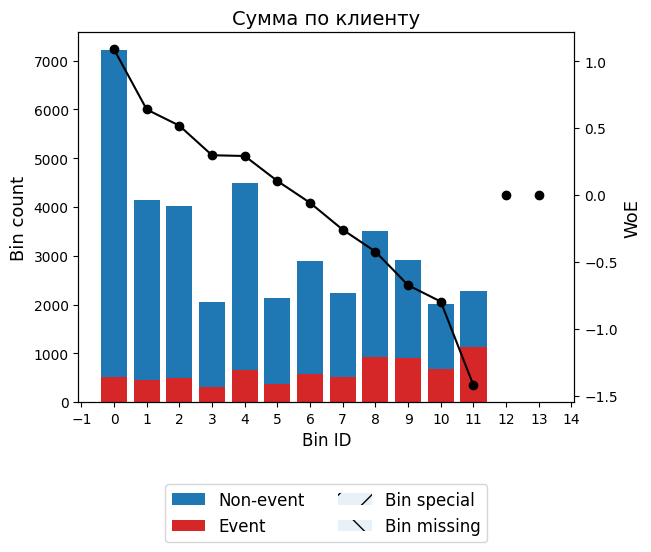

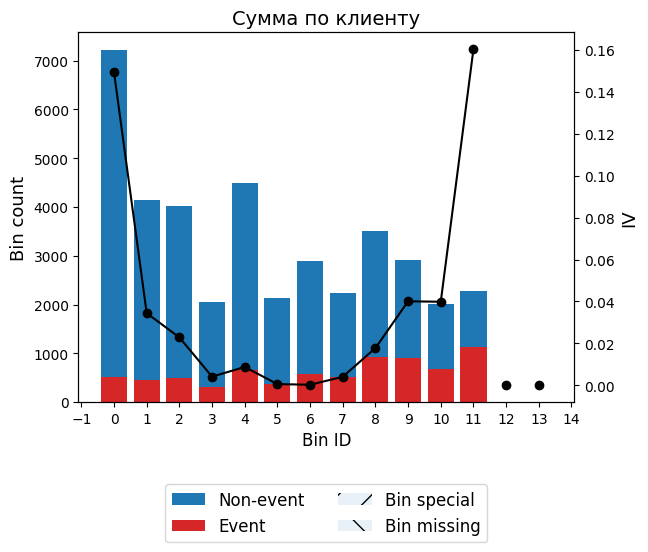

[  6.5  18.5  35.5  59.5  84.5 104.5 134.5 199.5 274.5 335.5 378.5 557.5]
OPTIMAL


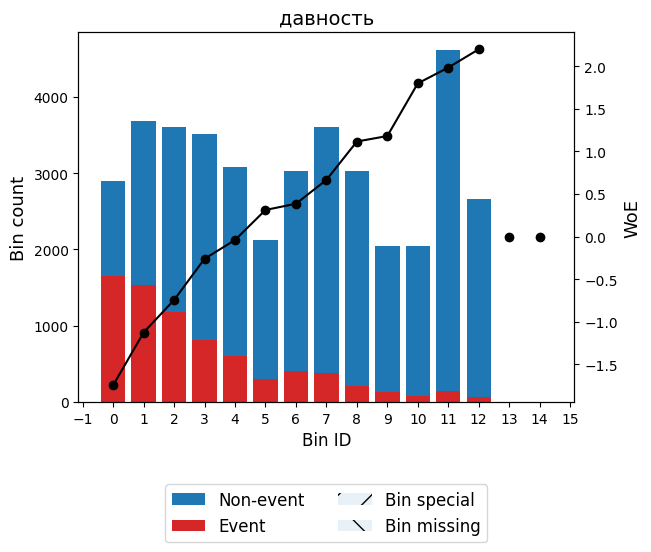

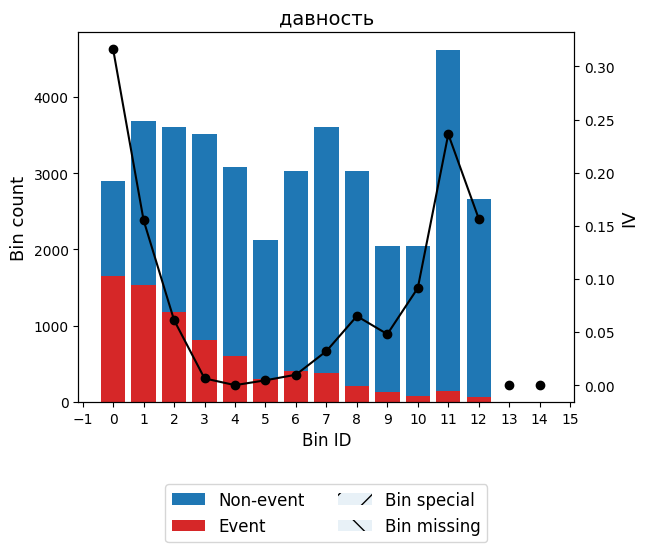

[ 2.5  5.5 10.5 15.5 20.5 26.5 33.5 43.5 72.5]
OPTIMAL


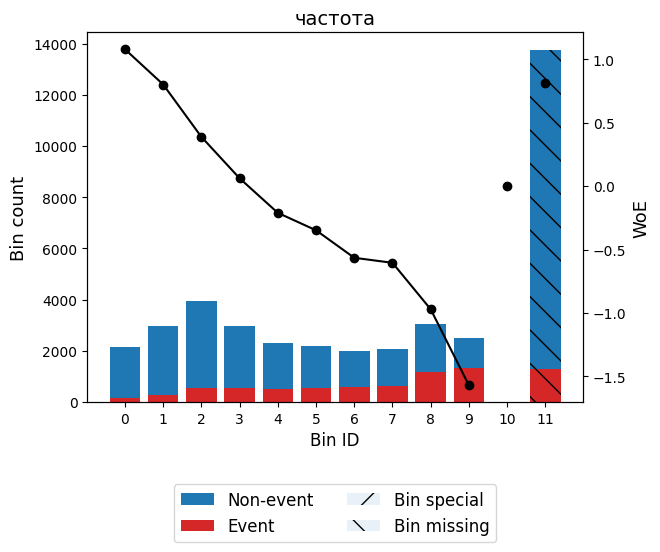

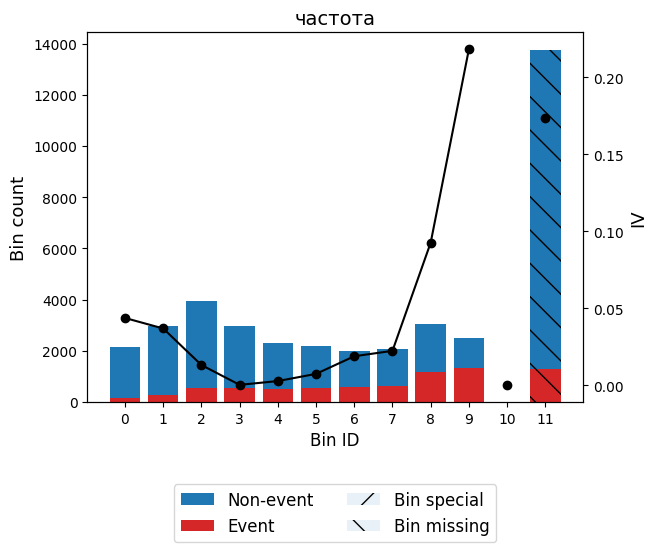

In [5]:
def featureBinning (variable):
    feature = trainingSample[variable].values
    optb = OptimalBinning(name=variable,
        dtype='numerical',
        solver='cp',
        min_n_bins=5,            # Minimum number of bins
        max_n_prebins=20,       # Maximum number of pre-bins
        min_bin_size=0.01,      # Lower minimum bin size
        max_bin_size=0.20)
    optb.fit(feature, trainingEvents)
    x_train = optb.transform(feature, metric='woe')
#print(feature)
    print(optb.splits)
    print(optb.status)
    binning_table = optb.binning_table
    binning_table.build()
    print(binning_table)
    binning_table.plot(metric="woe")
    binning_table.plot(metric="iv") 
    
variable = 'Сумма по клиенту'
featureBinning(variable)
variable = 'давность'
featureBinning(variable)
variable = 'частота'
featureBinning(variable)

# plt.xlabel('давность в днях')
# plt.ylabel('кол-во ')
# #trainingSample = trainingSample[trainingSample['событие'] == True]
# plt.bar(feature.unique(), trainingSample.groupby("давность")["событие"].count())
# plt.show()


In [7]:
# trainingSample1 = pd.read_csv('D:/maga_1/Машинное обучение/КлиментовАндрей_экспорт/for_binning.csv', index_col= False)
# print(trainingSample1)
# variable1 = 'R'
# feature1 = trainingSample1[variable1].values
# print(feature1)
# #optb = OptimalBinning(name=variable, dtype='numerical', solver='cp', min_bin_size=0.05, min_n_bins=5)
# optb = OptimalBinning(name=variable1,
#     dtype='numerical',
#     solver='cp',
#     min_n_bins=5,            # Minimum number of bins
#     max_n_prebins=20,       # Maximum number of pre-bins
#     min_bin_size=0.01,      # Lower minimum bin size
#     max_bin_size=0.20, verbose = True )
# optb.fit(feature1, trainingSample1['fact'])
# #print(feature)
# print(optb.splits)
# print(optb.status)
# binning_table = optb.binning_table
# binning_table.build()
# binning_table.plot(metric="woe")
# binning_table.plot(metric="iv") 



<h1>Тривиальная модель</h1>


In [6]:
def opt_binning(feature_name, feature_train, feture_test, event_train, event_test):
    
    optb = OptimalBinning(name=feature_name,
        dtype='numerical',
        solver='cp',
        min_n_bins=5,            # Minimum number of bins
               # Maximum number of pre-bins
        min_bin_size=0.05,      # Lower minimum bin size
        )
    optb.fit(feature_train, event_train)
    x_train = optb.transform(feature_train, metric='woe')
    #optb.fit(feture_test, event_test)
    x_test = optb.transform(feture_test, metric='woe')
    return x_train, x_test




In [7]:
#логистическая регрессия
variable = 'давность'
event = 'событие'

# trainingSampleNotNull = trainingSample.dropna(subset = variable)
# testSampleNotNull = testingSample.dropna(subset = variable)
feature = trainingSample[variable].values
featureTest = testingSample[variable].values
print(feature.mean())
trainFeature, testFeature = opt_binning(variable, feature, featureTest, trainingSample['событие'], testingSample['событие'])
##После биннинга
# = opt_binning(trainingSample, variable, event, testingSample)
print(trainFeature)
logistic_regressor = LogisticRegression()#penalty='l2', random_state=42) 
logistic_regressor.fit(trainFeature.reshape(-1, 1), trainingSample['событие'])
y_pred = logistic_regressor.predict(testFeature.reshape(-1, 1))
auc = metrics.roc_auc_score(testingSample['событие'], y_pred)
print(f'AUC Logistic regression: {auc:.2f}')
# r2 = r2_score(testSampleNotNull['событие'], y_pred)
#print(f'Accuracy Logistic regression: {auc:.2f}')
#регрессия Лассо
# alpha = 1 # Примеры значений alpha
# lasso_regression = linear_model.Lasso(alpha= alpha)
# lasso_regression.fit(feature.reshape(-1, 1), trainingSample['событие'])
# y_pred = lasso_regression.predict(testFeature.reshape(-1, 1))
# auc_log_single = metrics.roc_auc_score(trainingSample['событие'], y_pred)
# print(f'AUC Lasso regression: {auc_log_single:.2f}')

189.40452563524283
[ 2.19867577  2.19867577  2.19867577 ... -1.745033   -1.745033
 -1.745033  ]
AUC Logistic regression: 0.59


<h1>Многофакторная модель</h1>

In [8]:
#логистическая регрессия
names = ["доля суммы в послед визит", "Кол-во продаж", "доля визитов в вых", "частота", "Сумма по клиенту", "давность", "Сумма по любим группе", "Кол-во по любим группе"]
featureMultifactor = pd.DataFrame()
testFeatureMultifactor = pd.DataFrame()
for name in names:
    i = 0
    featureMultifactor_notBin = trainingSample[name].values
    testFeatureMultifactor_notBin = testingSample[name].values
    feature, test = opt_binning(name, featureMultifactor_notBin, testFeatureMultifactor_notBin,trainingSample['событие'],  testingSample['событие'])
    featureMultifactor.insert(i, name,feature)
    testFeatureMultifactor.insert(i, name,test)
    i = i +1


print(featureMultifactor)
logistic_regressor = LogisticRegression(penalty='l2', random_state=42) 
logistic_regressor.fit(featureMultifactor, trainingSample['событие'])
y_pred = logistic_regressor.predict(testFeatureMultifactor)
auc_log = metrics.roc_auc_score(testingSample['событие'], y_pred)
print(f'AUC Logistic regression: {auc_log:.2f}')

#регрессия Лассо
alpha = 0.1 # Примеры значений alpha
lasso_regression = linear_model.Lasso(alpha= alpha)
lasso_regression.fit(featureMultifactor, trainingSample['событие'])
y_pred = lasso_regression.predict(testFeatureMultifactor)
auc_lasso = metrics.roc_auc_score(testingSample['событие'], y_pred)
print(f'AUC Lasso regression: {auc_lasso:.2f}')

#регрессия Ridge
alpha = 1 # Примеры значений alpha
ridge_regression = linear_model.Ridge(alpha= alpha)
ridge_regression.fit(featureMultifactor, trainingSample['событие'])
y_pred = ridge_regression.predict(testFeatureMultifactor)
auc_ridge = metrics.roc_auc_score(testingSample['событие'], y_pred)
print(f'AUC Ridge regression: {auc_ridge:.2f}')

#Random Forest Model
n_estimators = 150
rf_regressor = RandomForestRegressor(n_estimators, random_state=42)
rf_regressor.fit(featureMultifactor, trainingSample['событие'])
y_pred = rf_regressor.predict(testFeatureMultifactor)
auc_RF = metrics.roc_auc_score(testingSample['событие'], y_pred)
print(f'AUC Random Forest regression: {auc_RF:.2f}')


       Кол-во по любим группе  Сумма по любим группе  давность  \
0                    0.616162               1.089117  2.198676   
1                    0.980450               0.639402  2.198676   
2                    0.980450               0.518332  2.198676   
3                    0.250334               1.089117  2.198676   
4                    0.004080              -0.673788  2.198676   
...                       ...                    ...       ...   
39901               -1.471088              -0.796256 -1.745033   
39902               -1.471088              -0.796256 -1.745033   
39903               -0.861625              -0.422689 -1.745033   
39904               -1.471088              -1.421545 -1.745033   
39905               -1.471088              -1.421545 -1.745033   

       Сумма по клиенту   частота  доля визитов в вых  Кол-во продаж  \
0              1.089117  0.000000            0.000000       0.852390   
1              0.639402  0.000000            0.000000       0.9

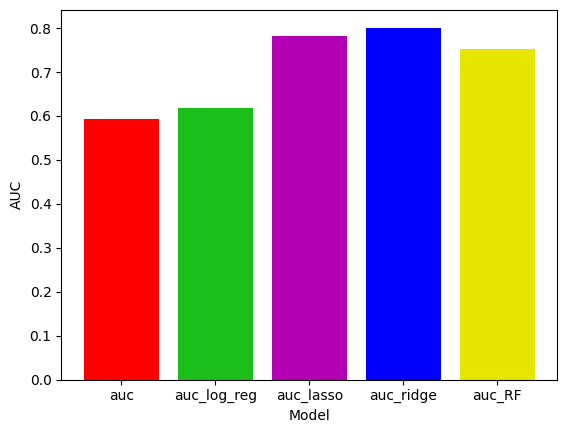

In [9]:
plt.bar("auc", auc, color = (1.0, 0, 0))
plt.bar("auc_log_reg", auc_log, color = (0.1, 0.75, 0.1))
plt.bar("auc_lasso", auc_lasso, color = (0.7, 0, 0.7))
plt.bar("auc_ridge", auc_ridge, color = (0, 0, 1.0))
plt.bar("auc_RF", auc_RF, color = (0.9, 0.9, 0))
plt.xlabel("Model")
plt.ylabel("AUC")
plt.show()

In [14]:
data = {
    'category': ['A', 'B', 'A', 'C', 'B', 'C', 'A'],
    'value': [10, 20, 10, 30, 20, 30, 10]
}
df = pd.DataFrame(data)
encoder = ce.BackwardDifferenceEncoder(cols=['category'])
df_encoded = encoder.fit_transform(df)
print(df_encoded)

   intercept  category_0  category_1  value
0          1   -0.666667   -0.333333     10
1          1    0.333333   -0.333333     20
2          1   -0.666667   -0.333333     10
3          1    0.333333    0.666667     30
4          1    0.333333   -0.333333     20
5          1    0.333333    0.666667     30
6          1   -0.666667   -0.333333     10


d:\maga_1\ML\.venv\Lib\site-packages\category_encoders\base_contrast_encoder.py:126: FutureWarning: Intercept column might not be added anymore in future releases (c.f. issue #370)
  warnings.warn("Intercept column might not be added anymore in future releases (c.f. issue #370)",
d:\maga_1\ML\.venv\Lib\site-packages\category_encoders\base_contrast_encoder.py:126: FutureWarning: Intercept column might not be added anymore in future releases (c.f. issue #370)
  warnings.warn("Intercept column might not be added anymore in future releases (c.f. issue #370)",


In [12]:
profile = ProfileReport(trainingSample, title="Data Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:10<00:00, 10.24s/it]
